# Data Analysis and Visualisations PRB dataset

*Ben McKeever 2023*

Notebook to investigate publication data from Physical Review B in 2019.

It might be useful to additionally see:

* [Notebook outlining details of the data collection via web scraping of PRB's website](<Web scraping Physical Review B workbook.ipynb>)
* [Notebook with examples scraping the data from PRB by using the Python package I developed](<Sample notebook for scraping publication data from PRB in 2019.ipynb>)

## Introduction

In this notebook I mainly address the impact of ["highlighted papers"](https://journals.aps.org/prb/edannounce/PhysRevB.92.210001) in PRB in 2019.
There are 3 sections:

* 1: Data Cleaning
* 2: Brief Investigation of issue 99/5. This dataset contains 82 papers out of which 5 were highlighted.
* 3: Investigation of the full dataset. This contains all 48 issues from 2019, which includes 4473 papers out of which 264 were highlighted.

The datasets used in this notebook, with data scraped from PRB on 25 Aug 2023, are available in the GitHub repository:

* `data_2023-08-25.csv` for the full dataset.
* `citations_issue_99_5.csv` for just the issue 99/5

The datasets can be downloaded by running the following cell with the # signs removed:

In [1]:
# !curl -O https://raw.githubusercontent.com/bfmkr/portfolio/main/assets/notebooks/data/data_2023-08-25.csv
# !curl -O https://raw.githubusercontent.com/bfmkr/portfolio/main/assets/notebooks/data/citations_issue_99_5.csv

In [2]:
from IPython.display import display, HTML
display(HTML("<style>.container {width:98% !important;}</style>"))

In [3]:
import numpy as np
import matplotlib
import matplotlib.pyplot as plt
import pandas as pd
import altair as alt

## 1: Data cleaning

### Improving the `section` column of the data

In the raw csv file, the `section` column of our scraped data includes the precise strings in kebab-case used in the `<div>` elements on PRB's website, which isn't ideal for display purposes:

In [4]:
!head -2 data_2023-08-25.csv

,section,issue,date_published,authors,name,is_highlighted,prb_citations
10.1103/PhysRevB.99.014101,sect-articles-structure-structural-phase-transitions-mechanical-properties-defects,99/1,2019-01-02,"Kevin Co, Fu-Chang Sun, S. Pamir Alpay, and Sanjeev K. Nayak",Polarization rotation in Bi4Ti3O12 by isovalent doping at the fluorite sublattice,False,16


We can update the section column to be more readable:

In [5]:
def to_kebab_case(value):
    return "-".join(value.lower().split()).replace(",","").replace(":","")

def clean_data(data):
    """ Clean the `section` column for the PRB dataset
    
    This also works for any subset of the data, e.g. individual issues.
    
    Parameters
    ==========
    data : pandas.DataFrame
        data as imported from our csv file using pandas
        where the section column is in kebab-case.
    
    Return
    ======
    data: pandas.DataFrame
        
    """

    section_names_from_data = sorted(list(set(data['section'].to_dict().values())))
    proper_section_names = sorted([
        'Electronic structure and strongly correlated systems',
        'Structure, structural phase transitions, mechanical properties, defects',
        'Semiconductors I: bulk',
        'Dynamics, dynamical systems, lattice effects',
        'Inhomogeneous, disordered, and partially ordered systems',    
        'Superfluidity and superconductivity',
        'Surface physics, nanoscale physics, low-dimensional systems',
        'Magnetism',
        'Semiconductors II: surfaces, interfaces, microstructures, and related topics'
     ])

    proper_section_names_kc = sorted([
        'sect-articles-'+ to_kebab_case(sec) for sec in proper_section_names
    ])
    mask = []
    for i, sec in enumerate(proper_section_names_kc):
        if sec in section_names_from_data:
            mask.append(i)

    sections = list(np.array(proper_section_names)[mask])

    new_sections_dict = dict()

    for i in data.index:
        for skc, s in zip(section_names_from_data,sections):
            if data['section'].loc[i] == skc:
                new_sections_dict[i] = s
                continue
    data['section'] = pd.Series(new_sections_dict)
    
    return data

Example of results, loading the full dataset:

In [6]:
data = clean_data(pd.read_csv('data_2023-08-25.csv',index_col=[0],parse_dates=[3]))
data.head()

,section,issue,date_published,authors,name,is_highlighted,prb_citations
10.1103/PhysRevB.99.014101,"Structure, structural phase transitions, mecha...",99/1,2019-01-02,"Kevin Co, Fu-Chang Sun, S. Pamir Alpay, and Sa...",Polarization rotation in Bi4Ti3O12 by isovalen...,False,16
10.1103/PhysRevB.99.014102,"Structure, structural phase transitions, mecha...",99/1,2019-01-07,"Jefferson Maul, Matthew R. Ryder, Michael T. R...",Pressure-driven mechanical anisotropy and dest...,False,24
10.1103/PhysRevB.99.014103,"Structure, structural phase transitions, mecha...",99/1,2019-01-08,"Jianfeng Chen, Wenyao Liang, and Zhi-Yuan Li",Strong coupling of topological edge states ena...,False,30
10.1103/PhysRevB.99.014104,"Structure, structural phase transitions, mecha...",99/1,2019-01-08,Ralf Drautz,Atomic cluster expansion for accurate and tran...,False,174
10.1103/PhysRevB.99.014105,"Structure, structural phase transitions, mecha...",99/1,2019-01-09,"Greg Stone, Danilo Puggioni, Shiming Lei, Ming...",Atomic and electronic structure of domains wal...,False,17


### Adding a `num_authors` column

Fortunately the `authors` column is in a standard format:

* *1 author*: "F. Lastname" 
* *2 authors*: "F. Lastname1 and F. Lastname2"
* *3+ authors*: "F. Lastname1, F. Lastname2, and F. Lastname3"
* *Many authors*: "F. Lastname et al."

Sometimes full first names and middle names are used, but that doesn't matter -- as we can see, we can usually just count the number of commas.  
In the case of *"Many authors"*, this means that the webpage from where we sourced the data didn't contain the full information and we need to look it up.

In [7]:
num_authors_dict = dict()
many_authors = [] # data to look up

for i in data.index:
    
    comma_count = data.loc[i]['authors'].count(',')
    
    if data.loc[i]['authors'].count('et al.'):
        many_authors.append(i) # data to look up
        continue
        
    if comma_count == 0 and 'and' not in data.loc[i]['authors']:
        num_authors_dict[i] = 1
        continue
        
    if comma_count == 0 and 'and' in data.loc[i]['authors']:
        num_authors_dict[i] = 2
        continue
    
    if comma_count >= 2:
        num_authors_dict[i] = comma_count + 1
        continue
          
    print("Any exceptions we didn't catch:\n")
    print(data.loc[i])

    
print("\nMany-authored data to look up:\n")
print(many_authors)

Any exceptions we didn't catch:

section           Electronic structure and strongly correlated s...
issue                                                        100/12
date_published                                  2019-09-16 00:00:00
authors                Edward A. Pluhar, III and Carsten A. Ullrich
name              Exchange-correlation magnetic fields in spin-d...
is_highlighted                                                False
prb_citations                                                     5
Name: 10.1103/PhysRevB.100.125135, dtype: object

Many-authored data to look up:

['10.1103/PhysRevB.99.224509', '10.1103/PhysRevB.100.045118']


From the output above we see that there is one extra exception to take care of, where an author has a Roman numeral (and therefore a comma) in their name.  
I scanned through the data manually and confirmed no other papers had authors with Roman numerals in their names.  
Final touches to `num_authors_dict`:

In [8]:
num_authors_dict['10.1103/PhysRevB.100.125135'] = 2  # Where one author has a Roman numeral in their name
num_authors_dict['10.1103/PhysRevB.99.224509'] = 28  # from https://doi.org/10.1103/PhysRevB.99.224509
num_authors_dict['10.1103/PhysRevB.100.045118'] = 26 # from https://doi.org/10.1103/PhysRevB.100.045118

Confirming that there is no missing data and finally updating the DataFrame:

In [9]:
print(len(num_authors_dict) == len(data))
data['num_authors'] = pd.Series(num_authors_dict)
data.head()

True


,section,issue,date_published,authors,name,is_highlighted,prb_citations,num_authors
10.1103/PhysRevB.99.014101,"Structure, structural phase transitions, mecha...",99/1,2019-01-02,"Kevin Co, Fu-Chang Sun, S. Pamir Alpay, and Sa...",Polarization rotation in Bi4Ti3O12 by isovalen...,False,16,4
10.1103/PhysRevB.99.014102,"Structure, structural phase transitions, mecha...",99/1,2019-01-07,"Jefferson Maul, Matthew R. Ryder, Michael T. R...",Pressure-driven mechanical anisotropy and dest...,False,24,4
10.1103/PhysRevB.99.014103,"Structure, structural phase transitions, mecha...",99/1,2019-01-08,"Jianfeng Chen, Wenyao Liang, and Zhi-Yuan Li",Strong coupling of topological edge states ena...,False,30,3
10.1103/PhysRevB.99.014104,"Structure, structural phase transitions, mecha...",99/1,2019-01-08,Ralf Drautz,Atomic cluster expansion for accurate and tran...,False,174,1
10.1103/PhysRevB.99.014105,"Structure, structural phase transitions, mecha...",99/1,2019-01-09,"Greg Stone, Danilo Puggioni, Shiming Lei, Ming...",Atomic and electronic structure of domains wal...,False,17,11


Packaging the above manipulations into a function for future use:

In [10]:
def add_num_authors(data):
    """ Adds `num_authors` column to the PRB 2019 dataset
    
    Parameters
    ==========
    
    data: pd.DataFrame
        the index of the DataFrame should be the DOI
    
    Returns
    =======
    
    data: pd.DataFrame
        DataFrame with a new `num_authors` column
    """
    
    num_authors_dict = dict()
    num_authors_dict['10.1103/PhysRevB.100.125135'] = 2  # Where one author has a Roman numeral in their name
    num_authors_dict['10.1103/PhysRevB.99.224509'] = 28  # from https://doi.org/10.1103/PhysRevB.99.224509
    num_authors_dict['10.1103/PhysRevB.100.045118'] = 26 # from https://doi.org/10.1103/PhysRevB.100.045118

    for i in data.index:

        comma_count = data.loc[i]['authors'].count(',')

        if data.loc[i]['authors'].count('et al.'):
            continue

        if comma_count == 0 and 'and' not in data.loc[i]['authors']:
            num_authors_dict[i] = 1
            continue

        if comma_count == 0 and 'and' in data.loc[i]['authors']:
            num_authors_dict[i] = 2
            continue

        if comma_count >= 2:
            num_authors_dict[i] = comma_count + 1
            continue

            
    data['num_authors'] = pd.Series(num_authors_dict)
    
    return data

## 2: Brief investigation of a single weekly issue (99/5)

In [11]:
df = clean_data(pd.read_csv('citations_issue_99_5.csv',index_col=[0],parse_dates=[3]))
df.head()

,section,issue,date_published,authors,name,is_highlighted,prb_citations
10.1103/PhysRevB.99.054101,"Structure, structural phase transitions, mecha...",99/5,2019-02-05,"Michal Stekiel, Adrien Girard, Tra Nguyen-Than...","Phonon-driven phase transitions in calcite, do...",False,7
10.1103/PhysRevB.99.054102,"Structure, structural phase transitions, mecha...",99/5,2019-02-06,Chris J. Pickard,Hyperspatial optimization of structures,True,13
10.1103/PhysRevB.99.054103,"Structure, structural phase transitions, mecha...",99/5,2019-02-07,"Wen Wang, Jian Shen, and Q.-C. He",Microscale superlubricity of graphite under va...,False,19
10.1103/PhysRevB.99.054104,"Structure, structural phase transitions, mecha...",99/5,2019-02-11,"V. B. Eltsov, A. Gordeev, and M. Krusius",Kelvin-Helmholtz instability of AB interface i...,False,3
10.1103/PhysRevB.99.054105,"Structure, structural phase transitions, mecha...",99/5,2019-02-21,"Xiaoying Zhuang, Bo He, Brahmanandam Javvaji, ...",Intrinsic bending flexoelectric constants in t...,False,58


### Summary Statistics

In [12]:
df.describe() 

,prb_citations
count,82.000000
mean,15.926829
std,17.174328
min,1.000000
25%,5.000000
50%,10.000000
75%,17.000000
max,80.000000


In [13]:
df['prb_citations'].median()

10.0

This issue contained 5 highlighted papers:

In [14]:
df[df['is_highlighted']]

,section,issue,date_published,authors,name,is_highlighted,prb_citations
10.1103/PhysRevB.99.054102,"Structure, structural phase transitions, mecha...",99/5,2019-02-06,Chris J. Pickard,Hyperspatial optimization of structures,True,13
10.1103/PhysRevB.99.054404,Magnetism,99/5,2019-02-06,Guo-Qiang Zhang and J. Q. You,Higher-order exceptional point in a cavity mag...,True,75
10.1103/PhysRevB.99.054430,Magnetism,99/5,2019-02-26,"B. F. McKeever, D. R. Rodrigues, D. Pinna, Ar....",Characterizing breathing dynamics of magnetic ...,True,28
10.1103/PhysRevB.99.054505,Superfluidity and superconductivity,99/5,2019-02-13,"Bitan Roy, Sayed Ali Akbar Ghorashi, Matthew S...",Topological superconductivity of spin-3/2 carr...,True,59
10.1103/PhysRevB.99.054516,Superfluidity and superconductivity,99/5,2019-02-25,"Subir Sachdev, Harley D. Scammell, Mathias S. ...",Gauge theory for the cuprates near optimal doping,True,46


Looking at statistics from each section:

In [15]:
df.groupby("section").describe()

prb_citations             \
                                                           count       mean   
section                                                                       
Dynamics, dynamical systems, lattice effects                 8.0  18.875000   
Inhomogeneous, disordered, and partially ordere...          11.0  17.272727   
Magnetism                                                   36.0  16.638889   
Structure, structural phase transitions, mechan...           7.0  21.142857   
Superfluidity and superconductivity                         20.0  10.900000   

                                                                           \
                                                          std  min    25%   
section                                                                     
Dynamics, dynamical systems, lattice effects        18.271269  1.0   7.50   
Inhomogeneous, disordered, and partially ordere...  13.900294  2.0   8.50   
Magnetism                                           18.825746  2.0   5.00   
Structure, structural phase transitions, mechan...  19.221763  3.0  10.00   
Superfluidity and superconductivity                 14.863944  1.0   3.75   

                                                                       
                                                     50%    75%   max  
section                                                                
Dynamics, dynamical systems, lattice effects        10.0  30.75  49.0  
Inhomogeneous, disordered, and partially ordere...  14.0  22.00  50.0  
Magnetism                                           11.0  16.25  80.0  
Structure, structural phase transitions, mechan...  13.0  27.00  58.0  
Superfluidity and superconductivity                  5.5  10.00  59.0

In the magnetism section, 75% of all articles have less than or equal to 16.25 citations on average, and this section was the largest with 36 papers out of the total 82.

### Citations in different sub-fields of condensed matter and materials physics

In [16]:
# adjust figure properties
plt.rc('font', size=9)
plt.rc('legend', fontsize=8)
matplotlib.rcParams['figure.dpi'] = 100

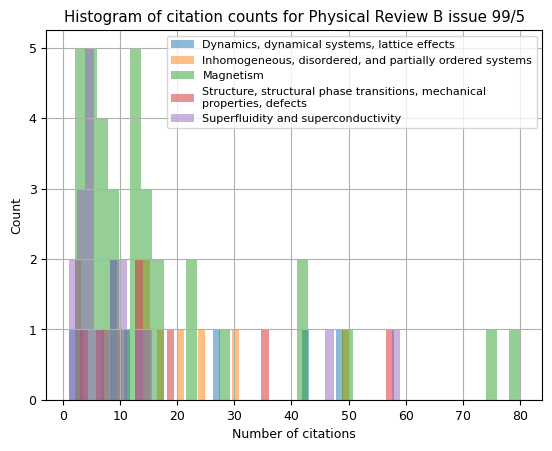

In [17]:
# creating some filters
df = pd.read_csv('citations_issue_99_5.csv',index_col=[0],parse_dates=[3])

f0 = df["section"]=='sect-articles-dynamics-dynamical-systems-lattice-effects'
f1 = df["section"]=='sect-articles-inhomogeneous-disordered-and-partially-ordered-systems'
f2 = df["section"]=='sect-articles-magnetism'
f3 = df["section"]=='sect-articles-structure-structural-phase-transitions-mechanical-properties-defects'
f4 = df["section"]=='sect-articles-superfluidity-and-superconductivity'

bins = 40

df[f0]["prb_citations"].hist(alpha=0.5,bins=bins)
df[f1]["prb_citations"].hist(alpha=0.5,bins=bins)
df[f2]["prb_citations"].hist(alpha=0.5,bins=bins)
df[f3]["prb_citations"].hist(alpha=0.5,bins=bins)
df[f4]["prb_citations"].hist(alpha=0.5,bins=bins)
plt.legend(["Dynamics, dynamical systems, lattice effects",
            "Inhomogeneous, disordered, and partially ordered systems",
            "Magnetism",
            "Structure, structural phase transitions, mechanical \nproperties, defects",
            "Superfluidity and superconductivity"
           ])
plt.title('Histogram of citation counts for Physical Review B issue 99/5')
plt.xlabel('Number of citations')
plt.ylabel('Count');
# plt.savefig('histogram_issue_99-5.png', bbox_inches='tight')

We can see that most papers had between 1 and 20 citations.  

To create web-friendly visualizations, we can use the [Altair package](https://altair-viz.github.io/index.html) as a front-end for the [Vega-Lite](https://vega.github.io/vega-lite/) Javascript library to produce interactive charts.  
As a simple example, here is another basic histogram of all citation counts for issue 99/5, this time using Altair:

In [18]:
alt.Chart(df).mark_bar().encode(
    x=alt.X('prb_citations',bin=True),
    y='count()',
    tooltip='count()'
)

alt.Chart(...)

### Plotting the top twenty most cited papers

Below we see the power of interactive charts using Altair.  
Hovering over the horizontal bars in the bar chart below displays metadata about each of the top twenty papers in a tooltip.

In [19]:
df = clean_data(pd.read_csv('citations_issue_99_5.csv',index_col=[0],parse_dates=[3]))
top_twenty = df.reset_index().sort_values(by=['prb_citations'],ascending=False).iloc[:20]
top_twenty.rename(columns={'index':'doi'},inplace=True)

alt.Chart(top_twenty.reset_index()).mark_bar().encode(
    x='prb_citations',
    y=alt.Y('doi',sort=alt.EncodingSortField(field='prb_citations',order='descending')),
    tooltip=['name','authors','section','prb_citations','date_published'],
    color='is_highlighted'
).properties(
    title='Top twenty papers published in PRB issue 99/5'
)

alt.Chart(...)

We can also easily filter the dataset by section. For example, here is another horizontal bar chart of just *Magnetism* papers in issue 99/5:

In [20]:
alt.Chart(df[df['section']=='Magnetism'].reset_index(),title='Top magnetism papers in issue 99/5').mark_bar().encode(
    x='prb_citations',
    y=alt.Y('index',sort=alt.EncodingSortField(field='prb_citations',order='descending')),
    tooltip=['name','authors','prb_citations','date_published'],
    color='is_highlighted'
).transform_window(
    window=[{'op': 'rank', 'as': 'rank'}],
    sort=[{'field': 'prb_citations', 'order': 'descending'}]
).transform_filter('datum.rank <= 20')

alt.Chart(...)

My paper is the second orange bar above: **10.1103/PhysRevB.99.054430**

### Citations by section

The Pandas `groupby` method can be used to investigate aggregations:

In [21]:
df1 = df.groupby('section').agg('sum', numeric_only=True).reset_index()
df1

,section,is_highlighted,prb_citations
0,"Dynamics, dynamical systems, lattice effects",0,151
1,"Inhomogeneous, disordered, and partially order...",0,190
2,Magnetism,2,599
3,"Structure, structural phase transitions, mecha...",1,148
4,Superfluidity and superconductivity,2,218


Using the data aggregated above, here is a simple breakdown of the number of citations by section in a visually pleasing Matplotlib chart:

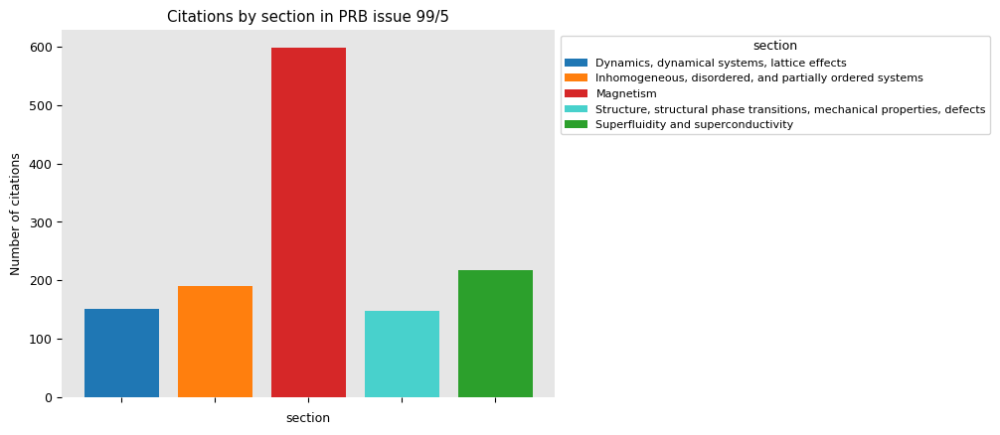

In [24]:
ax = plt.axes(facecolor='#E6E6E6')
ax.set_axisbelow = True

for spine in ax.spines.values():
    spine.set_visible(False)

ax.xaxis.tick_bottom()
ax.yaxis.tick_left()

bar_labels = df1['section'].values
bar_colors = ['tab:blue','tab:orange','tab:red','mediumturquoise','tab:green']

ax.bar(df1['section'], df1['prb_citations'], label=bar_labels, color=bar_colors)
ax.set_xlabel('section')
ax.set_ylabel('Number of citations')
ax.xaxis.set_major_formatter('')
ax.legend(title='section',bbox_to_anchor=(1,1), loc="upper left")
ax.set_title('Citations by section in PRB issue 99/5');

*Magnetism* was by far the largest section in this issue.

## 3: Data Analysis for full PRB dataset 

There isn't really enough data in a single issue to draw any convincing conclusions about the impact of highlighting.  
Moreover, in a given week, PRB doesn't publish research papers in *every* section of condensed matter and materials physics.  
We therefore also need more data to accurately compare citation statistics from different sections to each other.

In this part I investigate data from *all* 48 issues in 2019.

I mainly investigate 3 topics:

* (1) The distribution of the number of citations in highlighted papers versus non highlighted papers.
* (2) Whether the editors usually got it right -- if highlighted papers were generally speaking better received by the community as measured by the relative proportion of citations per issue.
* (3) For fun, I also briefly investigate whether the number of authors had any noticeable impact on the number of citations a paper received.

### Loading the data

In [25]:
data = clean_data(pd.read_csv('data_2023-08-25.csv',index_col=[0],parse_dates=[3]))
data = add_num_authors(data)
data.head()

,section,issue,date_published,authors,name,is_highlighted,prb_citations,num_authors
10.1103/PhysRevB.99.014101,"Structure, structural phase transitions, mecha...",99/1,2019-01-02,"Kevin Co, Fu-Chang Sun, S. Pamir Alpay, and Sa...",Polarization rotation in Bi4Ti3O12 by isovalen...,False,16,4
10.1103/PhysRevB.99.014102,"Structure, structural phase transitions, mecha...",99/1,2019-01-07,"Jefferson Maul, Matthew R. Ryder, Michael T. R...",Pressure-driven mechanical anisotropy and dest...,False,24,4
10.1103/PhysRevB.99.014103,"Structure, structural phase transitions, mecha...",99/1,2019-01-08,"Jianfeng Chen, Wenyao Liang, and Zhi-Yuan Li",Strong coupling of topological edge states ena...,False,30,3
10.1103/PhysRevB.99.014104,"Structure, structural phase transitions, mecha...",99/1,2019-01-08,Ralf Drautz,Atomic cluster expansion for accurate and tran...,False,174,1
10.1103/PhysRevB.99.014105,"Structure, structural phase transitions, mecha...",99/1,2019-01-09,"Greg Stone, Danilo Puggioni, Shiming Lei, Ming...",Atomic and electronic structure of domains wal...,False,17,11


Splitting the data into two subsets for investigating the impact of highlighting:

In [26]:
highlighted = data[data['is_highlighted']]
non_highlighted = data[data['is_highlighted']==False]

### Summary statistics for citations and number of authors

There were 4473 papers published in total in 2019, out of which 264 were highlighted by the editors:

In [28]:
print('All data:')

print(data.describe())
print('\nMedian values for all data:')
print(data[['prb_citations','num_authors']].median())

print('\n\nJust highlighted paper data:')

print(highlighted.describe())
print('\nMedian values for highlighted papers:')
print(highlighted[['prb_citations','num_authors']].median())

All data:
       prb_citations  num_authors
count    4473.000000  4473.000000
mean       13.954393     4.979432
std        18.445519     3.435194
min         0.000000     1.000000
25%         4.000000     3.000000
50%         9.000000     4.000000
75%        16.000000     6.000000
max       340.000000    28.000000

Median values for all data:
prb_citations    9.0
num_authors      4.0
dtype: float64


Just highlighted paper data:
       prb_citations  num_authors
count     264.000000   264.000000
mean       32.943182     5.541667
std        44.538707     3.959655
min         0.000000     1.000000
25%         9.000000     3.000000
50%        19.000000     4.000000
75%        36.000000     7.000000
max       340.000000    19.000000

Median values for highlighted papers:
prb_citations    19.0
num_authors       4.0
dtype: float64


Notice the following facts:

**Citations:**

* The mean paper for the whole dataset has 13.95 citations, while the average highlighted paper has 32.9 citations.
* The median paper for the whole dataset has 9 citations, while the median highlighted paper has 19 citations.

Using the median is a better measure, because (as we will soon see) there are outliers for highly cited papers.

**Authors:**

* The average number of authors per paper is 4.97, while the average number of authors on just highlighted papers is slightly higher at 5.54 per paper.

### Proportion of  citations gained by highlighted papers

We can manually verify that highlighted papers account for 13.9% of all citations:

In [29]:
highlighted['prb_citations'].sum() / data['prb_citations'].sum()

0.1393348072671345

### Illustrating the relative frequency of highlighted papers

Only a tiny proportion of papers are highlighted by the editors in each issue. A stacked bar chart nicely illustrates this:

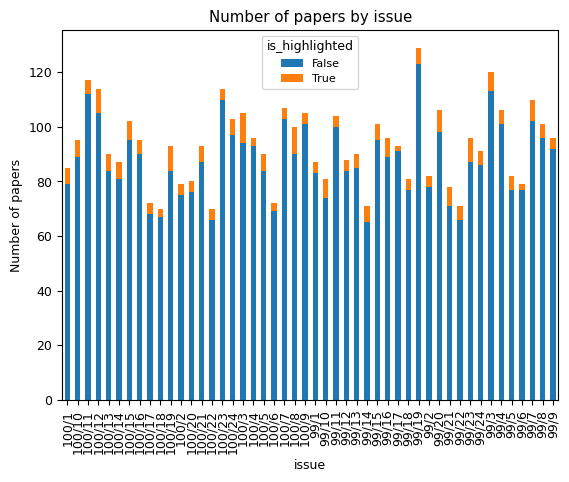

In [30]:
data.groupby(['issue','is_highlighted']).size().unstack().plot(kind='bar',stacked=True,
                                                               title='Number of papers by issue')
plt.ylabel('Number of papers');

For a rough comparison, another vertical bar chart can help to illustrate the proportion of citations gained by highlighted papers.
(Note that this one is not stacked!)

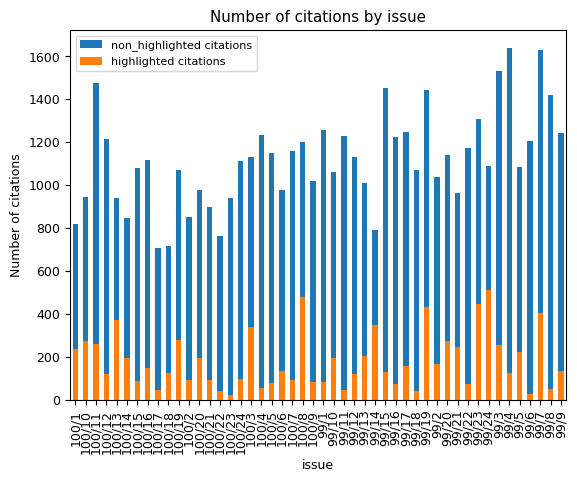

In [31]:
non_highlighted.groupby('issue')['prb_citations'] \
            .agg('sum').plot(kind='bar',
                             y='prb_citations',
                             color='tab:blue')
highlighted.groupby('issue')['prb_citations'] \
            .agg('sum').plot(kind='bar',
                             y='prb_citations',
                             color='tab:orange'
            )
plt.title('Number of citations by issue')
plt.legend(['non_highlighted citations','highlighted citations'])
plt.ylabel('Number of citations');

### Investigating highlighted papers across issues

We can also plot the count of highlighted papers per issue by itself.  
The mean number of papers highlighted per issue is 5.5:

In [32]:
highlighted.groupby('issue').sum(numeric_only=True).mean()

is_highlighted      5.500000
prb_citations     181.187500
num_authors        30.479167
dtype: float64

In [33]:
issues_chronologically_ordered = list(highlighted.issue.unique())
chart = alt.Chart(highlighted).mark_bar().encode(
    y='count()',
    x=alt.X('issue',sort=issues_chronologically_ordered).title('issues in chronological order'),
    tooltip='count()'
).properties(
    title='Number of highlighted papers per issue'
)

line = alt.Chart().mark_rule().encode(y=alt.datum(5.5)) # horizontal rule for the average

chart+line

alt.LayerChart(...)

* Issues 100/8 and 100/3 have the most papers highlighted with 10 and 11 respectively.
* The range is [2,11], while the mean is 5.5 (black line).

### Investigating number of citations by section and number of authors by section

In [34]:
data.groupby('section')['prb_citations'].describe()

,count,mean,std,min,25%,50%,75%,max
section,,,,,,,,
"Dynamics, dynamical systems, lattice effects",219.0,20.155251,26.919411,0.0,6.0,12.0,23.5,193.0
Electronic structure and strongly correlated systems,1258.0,14.778219,21.435091,0.0,4.0,9.0,17.0,340.0
"Inhomogeneous, disordered, and partially ordered systems",117.0,16.085470,19.478800,0.0,5.0,9.0,20.0,110.0
Magnetism,923.0,12.866739,14.996768,0.0,4.0,9.0,16.0,245.0
Semiconductors I: bulk,102.0,13.313725,11.058781,0.0,6.0,10.5,16.0,60.0
"Semiconductors II: surfaces, interfaces, microstructures, and related topics",212.0,12.419811,14.831380,0.0,4.0,8.0,15.0,123.0
"Structure, structural phase transitions, mechanical properties, defects",270.0,15.325926,20.694927,0.0,5.0,10.0,18.0,178.0
Superfluidity and superconductivity,470.0,10.897872,9.766473,0.0,4.0,8.0,15.0,60.0
"Surface physics, nanoscale physics, low-dimensional systems",902.0,13.751663,18.234031,0.0,4.0,9.0,16.0,236.0


From the above:

* *"Electronic structure..."* is by far is the largest section with 1258 papers, followed by *"Magnetism"* and *"Surface physics..."* with around 900 each papers each.

* It looks like Bibliographies in *"Superfluidity and superconductivity"* papers must be smaller than in other fields, because this section has the smallest mean number of citations, but it is by no means the smallest section -- it is 4th (out of 9) regarding the total number of publications.

Additionally we can look at how many papers are highlighted in each section, and the number of authors per paper:

In [35]:
df1 = data.groupby('section').agg('sum', numeric_only=True).reset_index()
df1['num_papers'] = data.groupby(['section']).size().values
df1['authors_per_paper'] = df1['num_authors'] / df1['num_papers']
df1

,section,is_highlighted,prb_citations,num_authors,num_papers,authors_per_paper
0,"Dynamics, dynamical systems, lattice effects",18,4414,1018,219,4.648402
1,Electronic structure and strongly correlated s...,100,18591,5958,1258,4.736089
2,"Inhomogeneous, disordered, and partially order...",9,1882,433,117,3.700855
3,Magnetism,59,11876,5537,923,5.998917
4,Semiconductors I: bulk,4,1358,508,102,4.980392
5,"Semiconductors II: surfaces, interfaces, micro...",13,2633,1100,212,5.188679
6,"Structure, structural phase transitions, mecha...",9,4138,1446,270,5.355556
7,Superfluidity and superconductivity,18,5122,2503,470,5.325532
8,"Surface physics, nanoscale physics, low-dimens...",34,12404,3770,902,4.179601


* Magnetism has the highest number of authors per paper. This matches personal experience from my PhD years, as experimental groups tend to be especially large.

#### Seeing which sections received most attention from the editors

In [36]:
df1['percentage_highlighted'] = df1['is_highlighted'] / df1['num_papers']
df1.groupby('section').sum(numeric_only=True).mean()

is_highlighted              29.333333
prb_citations             6935.333333
num_authors               2474.777778
num_papers                 497.000000
authors_per_paper            4.901558
percentage_highlighted       0.056932
dtype: float64

In [37]:
# tmp = data.groupby('section').agg('sum', numeric_only=True)
bars = alt.Chart(df1).mark_bar().encode(
    x=alt.X('section', axis=alt.Axis(labels=False),sort=alt.EncodingSortField('percentage_highlighted',order='descending')),
    y=alt.Y('percentage_highlighted').axis(format='%'),
    color='section',
    tooltip=['is_highlighted','num_papers']
).properties(
    width=500,
    height=400,
    title='Sorting sections by most attention received for highlighting'
)

line = alt.Chart().mark_rule().encode(y=alt.datum(0.0569)) # horizontal rule for the average


bars + line

alt.LayerChart(...)

The section *Dynamics, dynamical systems...* received the most attention from the editors, even though it is one of the smaller sections with only 219 papers.

#### Charts for breakdown of citations in each section

Matplotlib version

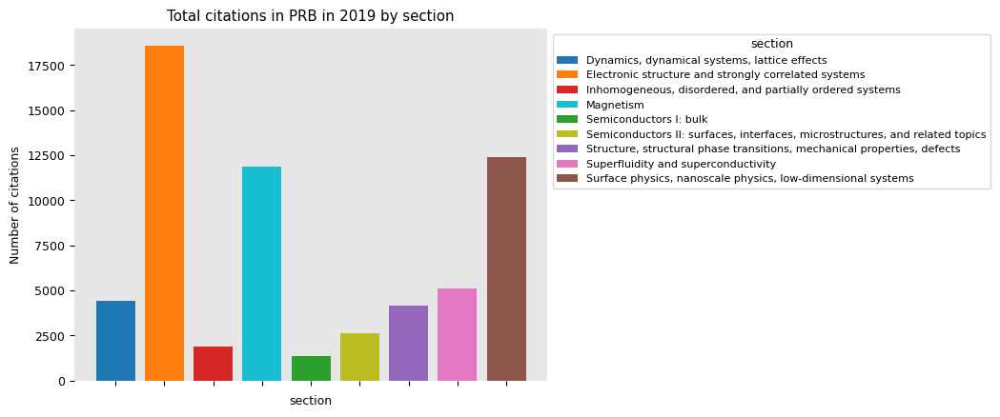

In [38]:
ax = plt.axes(facecolor='#E6E6E6')
ax.set_axisbelow = True

for spine in ax.spines.values():
    spine.set_visible(False)

ax.xaxis.tick_bottom()
ax.yaxis.tick_left()

bar_labels = df1['section'].values
bar_colors = ['tab:blue','tab:orange','tab:red','tab:cyan',
              'tab:green','tab:olive','tab:purple','tab:pink','tab:brown']

ax.bar(df1['section'], df1['prb_citations'], label=bar_labels, color=bar_colors)
ax.set_xlabel('section')
ax.set_ylabel('Number of citations')
ax.set_title('Total citations in PRB in 2019 by section')
ax.xaxis.set_major_formatter('')
ax.legend(title='section', bbox_to_anchor=(1,1), loc="upper left");

Recreation using Altair, for better web interactivity features:

In [39]:
tmp = data.groupby('section').agg('sum', numeric_only=True)
alt.Chart(tmp.reset_index()).mark_bar().encode(
    x=alt.X('section', axis=alt.Axis(labels=False)),
    y='prb_citations',
    color='section',
    tooltip=['prb_citations','section','is_highlighted']
).properties(
    width=500,
    height=400,
    title='Total citations in PRB in 2019 by section'
)

alt.Chart(...)

### Top cited papers

We can collect the top twenty most cited papers and visualize them as a horizontal bar chart.   
By using the Altair library we can have an interactive chart with a tooltip which shows interesting metadata about each paper when hovering over each bar:

In [40]:
top_twenty = data.reset_index().sort_values(by=['prb_citations'],ascending=False).iloc[:20]
top_twenty.rename(columns={'index':'doi'},inplace=True)

alt.Chart(top_twenty.reset_index()).mark_bar().encode(
    x='prb_citations',
    y=alt.Y('doi',sort=alt.EncodingSortField(field='prb_citations',order='descending')),
    tooltip=['name','authors','section','prb_citations','date_published'],
    color='is_highlighted'
).properties(
    title='Top twenty papers published by PRB in 2019'
)

alt.Chart(...)

Among the top 20 papers, the top 6 were all highlighted by the editors, and 11 out of the top 20 were highlighted by the editors.  
So far, it naively looks like the editors do a good job.

### Linking the "total citations" and "top papers" charts

By using `selection` features of Altair, we can link different charts together with a common filter.  
In this case, clicking a vertical bar in the *total citations* chart can change the papers displayed in the *top papers* chart:

In [41]:
reshaped_data = data.reset_index()
reshaped_data.rename(columns={'index':'doi'},inplace=True)
reshaped_data = reshaped_data.sort_values(by=['prb_citations'],ascending=False).set_index('doi')

In [42]:
section_list = list(set(reshaped_data['section'].values))
df_list = []

for sec in section_list:
    m = reshaped_data['section'] == sec
    df_list.append(reshaped_data[m].iloc[:20])

top_papers = pd.concat(df_list).sort_values(by=['prb_citations'],ascending=False)
# top_papers.head()

In [43]:
pts = alt.selection_point(encodings=['x'])

citations = alt.Chart(tmp.reset_index()).mark_bar().encode(
    x=alt.X('section', axis=alt.Axis(labels=False)),
    y='prb_citations',
    color=alt.condition(pts,'section',alt.value('lightgray'),
                        legend=alt.Legend(
        labelFontSize=9,
        orient='none',
        legendX=120,
        legendY=10,
        direction='vertical'
                        )),
    tooltip=['section','prb_citations']
).properties(
    width=450,
    height=400,
    title='Total citations in PRB in 2019 by section'
).add_params(pts)

papers = alt.Chart(top_papers.reset_index()).mark_bar().encode(
    x='prb_citations',
    y=alt.Y('doi',sort=alt.EncodingSortField(field='count',order='descending')),
    tooltip=['name','authors','section','prb_citations','date_published'],
    color=alt.Color('is_highlighted',scale=alt.Scale(scheme='category20')) # colors: https://vega.github.io/vega/docs/schemes/#reference
).properties(
    title='Top twenty papers'
).transform_window(
    window=[{'op': 'rank', 'as': 'rank'}],
    sort=[{'field': 'prb_citations', 'order': 'descending'}]
).transform_filter(pts).transform_filter('datum.rank <= 20')

(citations | papers).configure_legend(labelLimit=0).resolve_scale(
    color='independent'
)#.save('mychart2.html',embed_options={'renderer':'svg'})


alt.HConcatChart(...)

Below is a second variation, where the top twenty papers *within* each section is shown when the associated bar is clicked in the "Total citations..." chart:

In [44]:
pts = alt.selection_point(encodings=['x'], empty=False, on='click')

citations = alt.Chart(tmp.reset_index()).mark_bar().encode(
    x=alt.X('section', axis=alt.Axis(labels=False)),
    y='prb_citations',
    color=alt.condition(pts,'section',alt.value('lightgray')),
    tooltip=['section','prb_citations']
).properties(
    width=500,
    height=400,
    title='Total citations in PRB in 2019 by section'
).add_params(pts)

papers = alt.Chart(top_papers.reset_index()).mark_bar().encode(
    x=alt.X('prb_citations'),
    y=alt.Y('doi',sort=alt.EncodingSortField(field='prb_citations',order='descending')),
    tooltip=['name','authors','section','prb_citations','date_published'],
    color=alt.condition(pts,'is_highlighted',alt.ColorValue('grey'))
).properties(
    title='Top twenty papers by section'
).transform_filter(
    pts
)

citations | papers

alt.HConcatChart(...)

I didn't yet figure out how to combine the best elements of the last two examples above.
Ideally, I would like twenty papers to be shown at all times in the top papers chart.   
(The "top-K" example from vega-lite's documentation (https://vega.github.io/vega-lite/examples/window_top_k.html) doesn't quite cover this use case)

### Investigating the distribution of citations

Here we address topic (1) -- the distribution of citations for the whole dataset -- by plotting some histograms.

In [48]:
if 'doi' not in data.columns:
    data.reset_index(inplace=True)
    data.rename(columns={'index':'doi'},inplace=True)

Manually constructing some histograms of citation numbers using Matplotlib.

In [49]:
max_citations = data['prb_citations'].max()
max_citations_high = highlighted['prb_citations'].max()
count_of_citations = data.groupby('prb_citations')['doi'].count()
count_of_citations_high = highlighted.reset_index().groupby('prb_citations')['index'].count() #data.groupby('prb_citations')['is_highlighted'].sum()

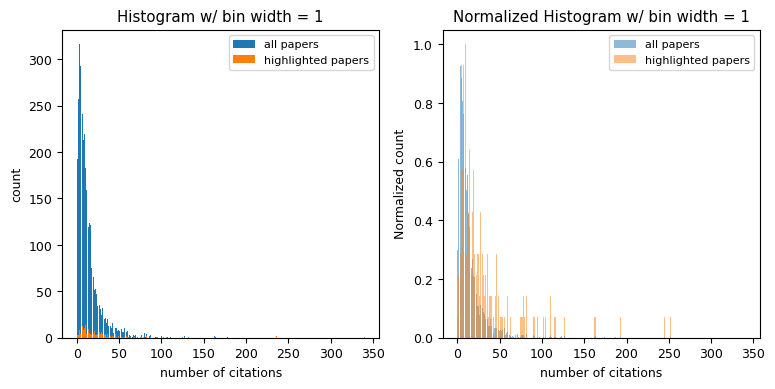

In [50]:
plt.figure(figsize=(9,4))
plt.subplot(1,2,1)

plt.bar(count_of_citations.index,count_of_citations,label='all papers')
plt.bar(count_of_citations_high.index,count_of_citations_high,label='highlighted papers')
plt.xlabel('number of citations')
plt.ylabel('count')
plt.title('Histogram w/ bin width = 1')
plt.legend()

# Normalized histogram:
plt.subplot(1,2,2)
plt.bar(count_of_citations.index,
        count_of_citations/count_of_citations.max(),
        label='all papers',
        alpha=0.5)
plt.bar(count_of_citations_high.index,
        count_of_citations_high/count_of_citations_high.max(),
        label='highlighted papers',
        alpha=0.5)
plt.xlabel('number of citations')
plt.ylabel('Normalized count')
plt.title('Normalized Histogram w/ bin width = 1')
plt.legend();

In the left plot above,

* The most frequent (modal) result among all data points is 3 citations (count = 316), corresponding to the blue peak.
* The most frequent (modal) result among just highlighted papers is 10 citations (count = 14), corresponding to the orange peak.

In [51]:
print('All papers: num citations =', count_of_citations.argmax(), ", count =", count_of_citations.max())
print('Just highlighted: num_citations =',count_of_citations_high.argmax(), ", count =",count_of_citations_high.max()) 

All papers: num citations = 3 , count = 316
Just highlighted: num_citations = 10 , count = 14


In the right plot above, notice that the subset of highlighted papers doesn't give us a nice smooth distribution anymore on this scale.   
This is to be expected because they account for only a small fraction (~5.9%) of the full dataset.

The highlighted papers also have a significantly larger standard deviation (44.5 versus 18.4):

In [52]:
print(data['prb_citations'].std())
print(highlighted['prb_citations'].std())

18.445519404074943
44.53870652804313


Here is a version of the distribution of citations using Altair with a dual axis, for a more web-friendly visualization, this time with bin width = 5 citations.

In [54]:
max_citations_highlighted = highlighted['prb_citations'].max()
max_citations_non_highlighted = non_highlighted['prb_citations'].max()

bin_width = 5
opacity = 0.5

chart1 = alt.Chart(highlighted).mark_bar(opacity=opacity).encode(
    x=alt.X('prb_citations',bin=alt.Bin(extent=[0,max_citations], step=bin_width)),
    y=alt.Y('count()').title('Count (highlighted papers only)').axis(titleColor='red'),
    tooltip='count()',
    color=alt.value('red')
)

chart2 = alt.Chart(non_highlighted).mark_bar(opacity=opacity).encode(
    x=alt.X('prb_citations',bin=alt.Bin(extent=[0,max_citations], step=bin_width)),
    y=alt.Y('count()').title('Count (non highlighted papers only)').axis(titleColor='steelblue'),
    tooltip='count()',
    color=alt.value('steelblue')
)

(chart2 + chart1).resolve_scale(y='independent').properties(
    title='Distribution of citations',
    width=300,
    height=300
).configure_axis(
    titleFontSize=15,
    labelFontSize=13
).interactive()#.save('citations_distribution.html',embed_options={'renderer':'svg'})

alt.LayerChart(...)

The plot above ends up being quite a large file size (~1.7MB) because Altair dumps *all* of the source data into json, which comprises the whole dataset.   
We could preprocess the data manually first into a new dataframe to make it smaller.

### Data by issue

In [55]:
higlighted_by_issue = highlighted.groupby('issue').sum(numeric_only=True)
non_higlighted_by_issue = non_highlighted.groupby('issue').sum(numeric_only=True)

We can compare the highlighted and non-highlighted subsets of the data by merging these two new DataFrames on the `issue` column, and creating some new columns for comparisons.

In [64]:
data_by_issue = higlighted_by_issue.merge(non_higlighted_by_issue,
                                          on='issue',
                                          suffixes=('_high','_nonhigh'))
data_by_issue.drop('is_highlighted_nonhigh', axis=1, inplace=True)
data_by_issue.rename(columns={'is_highlighted_high':'num_highlighted'},inplace=True)

# Creating some useful new fields:
data_by_issue['prb_citations'] = data_by_issue['prb_citations_high'] + data_by_issue['prb_citations_nonhigh']
data_by_issue['cite_ratio'] = data_by_issue['prb_citations_high'] / (data_by_issue['prb_citations_high'] 
    + data_by_issue['prb_citations_nonhigh'])
data_by_issue.reset_index(inplace=True)
data_by_issue['num_papers'] = data.groupby('issue').size().values
data_by_issue['highlighted_ratio'] = data_by_issue['num_highlighted'] / data_by_issue['num_papers']

# Compare the percentage of citations gained by highlighted papers to the proportion of highlighted papers in each issue:
data_by_issue['editor_success'] = pd.Series([True if i > j else False for i,j in 
                  zip(data_by_issue['cite_ratio'].to_list(),data_by_issue['highlighted_ratio'].to_list())])
data_by_issue.head()

,issue,num_highlighted,prb_citations_high,num_authors_high,prb_citations_nonhigh,num_authors_nonhigh,prb_citations,cite_ratio,num_papers,highlighted_ratio,editor_success
0,100/1,6,235,36,820,407,1055,0.222749,85,0.070588,True
1,100/10,6,272,39,945,482,1217,0.223500,95,0.063158,True
2,100/11,5,258,15,1477,520,1735,0.148703,117,0.042735,True
3,100/12,9,119,50,1216,425,1335,0.089139,114,0.078947,True
4,100/13,6,370,36,942,460,1312,0.282012,90,0.066667,True


Note that the new columns for `num_authors` are a simple sum of the number of authors for all of the matching papers in the original dataset, including repeats.  
So these numbers will be larger than the number of unique scientists.

Summary statistics:

In [65]:
data_by_issue[['highlighted_ratio','cite_ratio']].describe()

,highlighted_ratio,cite_ratio
count,48.000000,48.000000
mean,0.059122,0.133506
std,0.019538,0.081117
min,0.021505,0.021916
25%,0.045846,0.069212
50%,0.056349,0.115193
75%,0.070464,0.195144
max,0.104762,0.320200


Some notes:

* The mean number of citations gained by highlighted papers per issue quoted as a percentage of the total is 13.5%. This means roughly that highlighted papers can be expected to account for 13.5% of the total citations in that issue.

* Meanwhile, highlighted papers account for 5.9% of papers published each issue on average. 


Loosely speaking, highlighted papers are 13.5% - 5.9% = 7.6% better than the average paper in a given issue.

### Drilling down to individual issues

In [66]:
issues_chronologically_ordered = list(data.issue.unique())

pts = alt.selection_point(encodings=['x'])

cite_ratio_by_issue = alt.Chart(data_by_issue).mark_bar().encode(
    y=alt.Y('cite_ratio').axis(format='%').title('percentage'),
    x=alt.X('issue',sort=issues_chronologically_ordered).title('issues in chronological order'),
    tooltip=['cite_ratio','prb_citations_high','prb_citations_nonhigh','highlighted_ratio','num_highlighted','num_papers'],
    color=alt.condition(pts,'editor_success',alt.value('lightgray'),
                        legend=alt.Legend(
            orient='none',
            legendX=600,
            legendY=10
            ))
).properties(
    title='Percentage of citations gained by highlighted papers in 2019 within each issue',
    width=690,
    height=285
).add_params(pts)

max_cite_ratio = data_by_issue['cite_ratio'].max()
bin_width = 0.02

histogram_cite_ratio = alt.Chart(data_by_issue).mark_bar().encode(
    x=alt.X('cite_ratio',bin=alt.Bin(extent=[0,max_cite_ratio], step=bin_width)).axis(format='%'),
    y=alt.Y('count()').title('Number of issues'),
    tooltip=['count()']
).properties(
    title="Histogram of % citations for highlighted papers",
    height=285
).transform_filter(pts)

(cite_ratio_by_issue | histogram_cite_ratio).configure_axis(
    titleFontSize=15,
    labelFontSize=12
)#.save('proportion_citations_highlighted1.html',embed_options={'renderer':'svg'})

alt.HConcatChart(...)

The first thing we notice is that there is a high degree of variance:

* In issue 99/24, the 5 highlighted issues account for a staggering 32.02% of the total number of citations -- far more than their share as highlighted papers make up 5.49% of publications in this issue.
* In issue 99/6, highlighted papers accounted for 2.19% of the total number of citations.

In the plot above a simple binary measure of **editor success** is shown: the color of the bars encode whether or not the highlighted papers achieved more than their fair share of citations.  
This was done by comparing the percentage of citations gained by highlighted papers to the proportion of highlighted papers in each issue.

* For example, 4 out of 87 papers were highlighted in issue 99/1, which is smaller than the value of 6.1% which is the proportion of citations earned by those papers. Hence highlighted papers earned more than their share of citations in this issue which means `editor_success = True`.

According to this measure, the editors were not *always* accurate in their prediction: 9 issues out of the 48 had highlighted papers accounting for less than we would expect by treating all papers equally.  
Therefore we can say the editors were accurate 39/48 = 81.25% of the time in 2019.

Note: we could also add colors above to further drill down each issue by section if we want to display even more information, but that could make the plot *too busy*.

### Ordering most successful issues to least successful issues

We can further quantify the *measure of success* for the editors in each issue by looking at the difference of the two quantities.

In [67]:
data_by_issue['measure_of_success'] = data_by_issue['cite_ratio'] - data_by_issue['highlighted_ratio']

In [72]:
data_by_issue.head()

,issue,num_highlighted,prb_citations_high,num_authors_high,prb_citations_nonhigh,num_authors_nonhigh,prb_citations,cite_ratio,num_papers,highlighted_ratio,editor_success,measure_of_success
0,100/1,6,235,36,820,407,1055,0.222749,85,0.070588,True,0.152161
1,100/10,6,272,39,945,482,1217,0.223500,95,0.063158,True,0.160343
2,100/11,5,258,15,1477,520,1735,0.148703,117,0.042735,True,0.105968
3,100/12,9,119,50,1216,425,1335,0.089139,114,0.078947,True,0.010191
4,100/13,6,370,36,942,460,1312,0.282012,90,0.066667,True,0.215346


Plotting the measure of success of individual issues:

In [73]:
alt.Chart(data_by_issue).mark_bar().encode(
    y=alt.Y('measure_of_success').axis(format='%').title('% difference'),
    x=alt.X('issue',sort=alt.EncodingSortField('measure_of_success',order='descending')),
    tooltip=['measure_of_success','prb_citations_high','prb_citations_nonhigh','num_highlighted','num_papers'],
    color='editor_success'
).properties(
    title='Most successful to least successful issues in 2019'
)#.save('most-successful-to-least-successful-issues.html',embed_options={'renderer':'svg'})

alt.Chart(...)

According to this measure, the most successful issue for the editors was 99/24, and the least successful issue was 99/16.

In [69]:
filt1 = data_by_issue['issue'] == '99/24' 
filt2 = data_by_issue['issue'] == '99/6'
data_by_issue[filt1 | filt2]

,issue,num_highlighted,prb_citations_high,num_authors_high,prb_citations_nonhigh,num_authors_nonhigh,prb_citations,cite_ratio,num_papers,highlighted_ratio,editor_success,measure_of_success
40,99/24,5,512,14,1087,430,1599,0.320200,91,0.054945,True,0.265255
44,99/6,2,27,8,1205,419,1232,0.021916,79,0.025316,False,-0.003401


Future questions for another time:

* Is there a correlation between the percentage highlighted and the cite_ratio? 
* If more papers are highlighted in an issue, does that mean the issue is more successful overall?

In [74]:
print('Average % of citations from highlighted papers per issue = ', 
      100*data_by_issue['cite_ratio'].mean(), '%')
print('Average number of highlighted papers per issue =', 
      data_by_issue['num_highlighted'].mean())

Average % of citations from highlighted papers per issue =  13.350638226226739 %
Average number of highlighted papers per issue = 5.5


### Investigating the success of individual issues

The citations per paper in each issue can be used to quantify the impact of an issue.

In [75]:
data_by_issue['citations_per_paper'] = data_by_issue['prb_citations'] / data_by_issue['num_papers']

In [76]:
issues_chronologically_ordered = list(data.issue.unique())
alt.Chart(data_by_issue).mark_bar().encode(
    y='mean(citations_per_paper)',
    x=alt.X('issue',sort=issues_chronologically_ordered).title('issues in chronological order'),
    tooltip=['prb_citations_high','prb_citations_nonhigh','highlighted_ratio','num_highlighted','num_papers']
#     color='editor_success'
)

alt.Chart(...)

It appears like there is a weak downwards trend. We can attribute this to a recency bias -- issue 99/1 was released almost a year before issue 100/24.  
To eliminate the bias, we would need to collect the number of citations for each paper at an equal time after initial publication.


In principle, the downwards trend will eventually level out if we collect the data at a later date -- the mere existence of any downwards trend at all suggests that 4 years is not long enough yet for the true impact of the average paper to be recognized by the condensed matter physics community.

### Investigating if editors were more successful in some sections more than others

In [77]:
highlighted_by_section = highlighted.groupby('section').sum(numeric_only=True)
non_higlighted_by_section = non_highlighted.groupby('section').sum(numeric_only=True)

In [78]:
highlighted_by_section.head()

,is_highlighted,prb_citations,num_authors
section,,,
"Dynamics, dynamical systems, lattice effects",18,770,101
Electronic structure and strongly correlated systems,100,3704,421
"Inhomogeneous, disordered, and partially ordered systems",9,436,28
Magnetism,59,1728,475
Semiconductors I: bulk,4,116,16


Just like in the previous analysis, we can perform another merge to compare highlighted and non-highlighted papers.

In [80]:
data_by_section = highlighted_by_section.merge(non_higlighted_by_section,
                                          on='section',
                                          suffixes=('_high','_nonhigh'))
data_by_section.drop('is_highlighted_nonhigh', axis=1, inplace=True)
data_by_section.rename(columns={'is_highlighted_high':'num_highlighted'},inplace=True)

data_by_section['cite_ratio'] = data_by_section['prb_citations_high'] / (data_by_section['prb_citations_high'] + data_by_section['prb_citations_nonhigh'])
data_by_section['num_papers'] = data.groupby('section').size().values
data_by_section['mean_citations'] = data.groupby('section').mean(numeric_only=True)['prb_citations']
data_by_section['median_citations'] = data.groupby('section').median(numeric_only=True)['prb_citations']

data_by_section['mean_over_total'] = data_by_section['mean_citations'] / (data_by_section['prb_citations_high'] + data_by_section['prb_citations_nonhigh'])

In [81]:
data_by_section

,num_highlighted,prb_citations_high,num_authors_high,prb_citations_nonhigh,num_authors_nonhigh,cite_ratio,num_papers,mean_citations,median_citations,mean_over_total
section,,,,,,,,,,
"Dynamics, dynamical systems, lattice effects",18,770,101,3644,917,0.174445,219,20.155251,12.0,0.004566
Electronic structure and strongly correlated systems,100,3704,421,14887,5537,0.199236,1258,14.778219,9.0,0.000795
"Inhomogeneous, disordered, and partially ordered systems",9,436,28,1446,405,0.231668,117,16.085470,9.0,0.008547
Magnetism,59,1728,475,10148,5062,0.145504,923,12.866739,9.0,0.001083
Semiconductors I: bulk,4,116,16,1242,492,0.085420,102,13.313725,10.5,0.009804
"Semiconductors II: surfaces, interfaces, microstructures, and related topics",13,184,79,2449,1021,0.069882,212,12.419811,8.0,0.004717
"Structure, structural phase transitions, mechanical properties, defects",9,334,31,3804,1415,0.080715,270,15.325926,10.0,0.003704
Superfluidity and superconductivity,18,387,117,4735,2386,0.075556,470,10.897872,8.0,0.002128
"Surface physics, nanoscale physics, low-dimensional systems",34,1038,195,11366,3575,0.083683,902,13.751663,9.0,0.001109


In [82]:
prop = alt.Chart(data_by_section.reset_index()).mark_bar().encode(
    x=alt.X('section', axis=alt.Axis(labels=False)),
    y=alt.Y('cite_ratio').axis(format='%').title('% citations from highlighted papers'),
    tooltip=['num_highlighted', 'num_papers', 'prb_citations_high','prb_citations_nonhigh'],
    color='section'
).properties(
    title='Proportion of citations from highlighted papers in 2019',
    width=500
).configure_legend(labelLimit=0).configure_axis(
    titleFontSize=15,
    labelFontSize=12
)#.save('proportion_highlighted_by_section.html',embed_options={'renderer':'svg'})



prop


# ticks = alt.Chart(data_by_section.reset_index()).mark_tick().encode(
#     x=alt.X('section', axis=alt.Axis(labels=False)),
#     y=alt.Y('mean_over_total').axis(format='%').title('mean values'),
#     tooltip=['num_highlighted', 'prb_citations_high','prb_citations_nonhigh'],
# #     color='section'
# )


# (prop + ticks).configure_legend(labelLimit=0).configure_axis(
#     titleFontSize=15,
#     labelFontSize=12
# )

# ticks

alt.Chart(...)

Because some sections have significantly more highlighted papers than others, the plot above isn't too informative.
We can compare this data to the percentage of highlighted papers within each section to get an improved understanding.

In [83]:
data_by_section['measure_of_success'] = data_by_section['cite_ratio'] - (data_by_section['num_highlighted'] / data_by_section['num_papers'] )

In [84]:
alt.Chart(data_by_section.reset_index()).mark_bar().encode(
    x=alt.X('section', axis=alt.Axis(labels=False),sort=alt.EncodingSortField('measure_of_success',order='descending')),
    y=alt.Y('measure_of_success').axis(format='%').title('% difference'),
    tooltip=['num_highlighted', 'num_papers', 'prb_citations_high','prb_citations_nonhigh'],
    color='section'
).configure_legend(labelLimit=0).properties(
    width=500
).configure_axis(
    titleFontSize=15,
    labelFontSize=12
).properties(
    title='Most successful to least successful sections in 2019'
)#.save('most_successful_to_least_successful_sections.html',embed_options={'renderer':'svg'})

alt.Chart(...)

## Extra: Investigation of the number of authors

Here we address the third topic: does the number of authors influence the number of citations?

The majority of papers had 3 authors:

In [85]:
max_num_authors = data['num_authors'].max()

alt.Chart(data,title="Histogram of number of authors").mark_bar().encode(
    y=alt.Y('count()').title('Count'),
    x=alt.X('num_authors',bin=alt.Bin(extent=[0,max_num_authors], step=1)).title('num_authors'),
    tooltip=['count()','num_authors'],
    color='is_highlighted'
).interactive()

alt.Chart(...)

Next, a scatter plot of `num_authors` versus `prb_citations` alongside the histogram:

In [87]:
left = alt.Chart(data,title='Citations versus number of authors').mark_point(filled=True).encode(
    alt.OpacityValue(0.7),
    y='prb_citations',
    x='num_authors',
    tooltip=['prb_citations','num_authors','name','authors','section','issue','date_published'],
    color='is_highlighted'#alt.condition(interval,'section', alt.value('lightgray')),
).properties(height=350,width=370).interactive()#.save('citations_vs_num_authors.html',embed_options={'renderer':'svg'})


right = alt.Chart(data,title="Histogram of number of authors").mark_bar().encode(
    y=alt.Y('count()').title('Count'),
    x=alt.X('num_authors',bin=alt.Bin(extent=[0,max_num_authors], step=1)).title('num_authors'),
    tooltip=['count()','num_authors'],
    color='is_highlighted'
).properties(height=350,width=370).interactive()

(left | right)#.save('citations_vs_num_authors.html',embed_options={'renderer':'svg'})

alt.HConcatChart(...)

* Each point in the scatter plot above corresponds to a unique research paper. Hovering over the points shows interesting metadata about the paper.
* The mouse wheel can be used to zoom in. Click and drag the chart to move around, and double-click to reset the view.


We can also facet by section to check if there are any discernable differences between sections.

In [88]:
alt.Chart(data).mark_point(filled=True).encode(
    y='prb_citations',
    x='num_authors',
    tooltip=['prb_citations','num_authors','name','authors','issue','date_published'],
    column='section'
)

alt.Chart(...)

Number of authors within each issue, with size for the number of citations:

In [89]:
interval = alt.selection_interval()

alt.Chart(data).mark_point(filled=True).encode(
    alt.OpacityValue(0.7),
    x='issue',
    y='num_authors',
    tooltip=['prb_citations','num_authors','name','authors','date_published'],
    color=alt.condition(interval,'section', alt.value('lightgray')),
    size='prb_citations'
).add_params(
    interval
)

alt.Chart(...)

### Distribution plots and joint distribution plots using Seaborn

In [90]:
import seaborn as sns
sns.set()

We can get a smooth estimate of the distributions using a kernel density estimation using `sns.kdeplot`

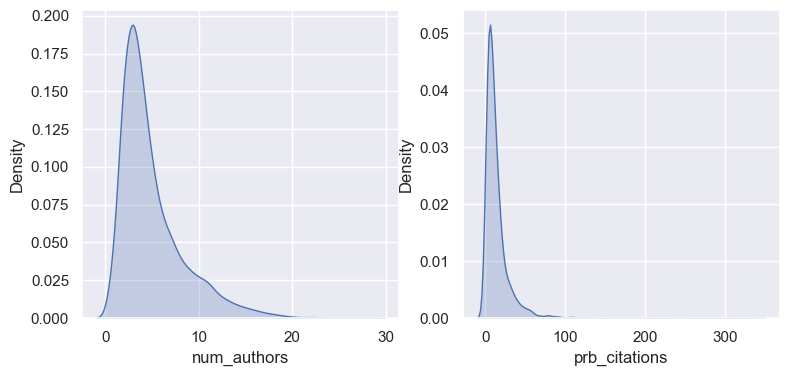

In [91]:
plt.figure(figsize=(9,4))
plt.subplot(1,2,1)
sns.kdeplot(data['num_authors'],fill=True)

plt.subplot(1,2,2)
sns.kdeplot(data['prb_citations'],fill=True);

The histograms can be plotted underneath the kernel density estimation using `sns.distplot`

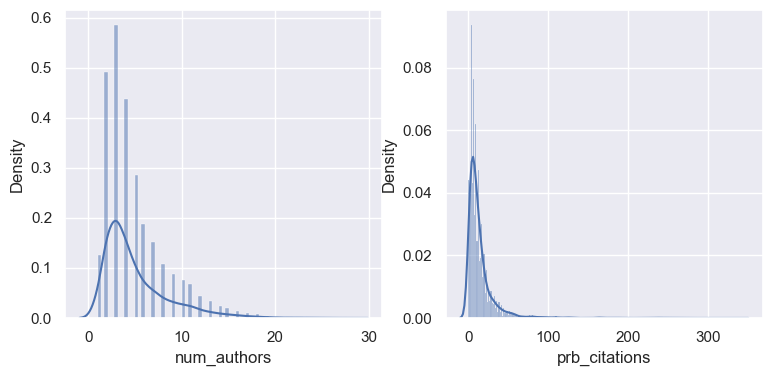

In [93]:
plt.figure(figsize=(9,4))
plt.subplot(1,2,1)
sns.histplot(data['num_authors'],kde=True,stat='density',kde_kws=dict(cut=3))

plt.subplot(1,2,2)
sns.histplot(data['prb_citations'],kde=True,stat='density',kde_kws=dict(cut=3));

A 2D kernel density plot:

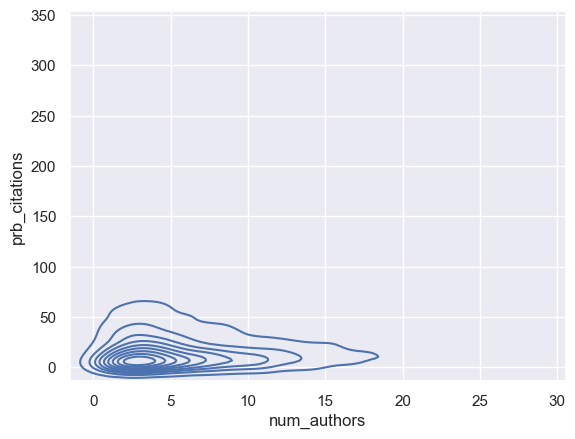

In [94]:
distdata = data.set_index('doi')[["num_authors","prb_citations"]]
distdata = data[["num_authors","prb_citations"]]
sns.kdeplot(data=distdata,x='num_authors',y='prb_citations');

Joint distribution plots

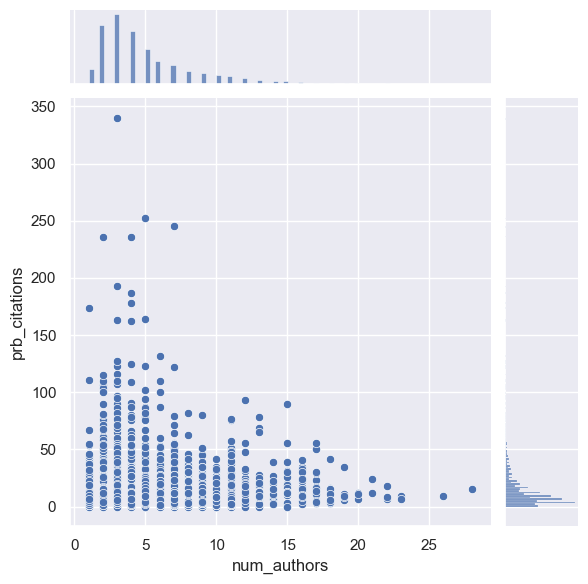

In [95]:
sns.jointplot(data=distdata,x='num_authors',y='prb_citations');

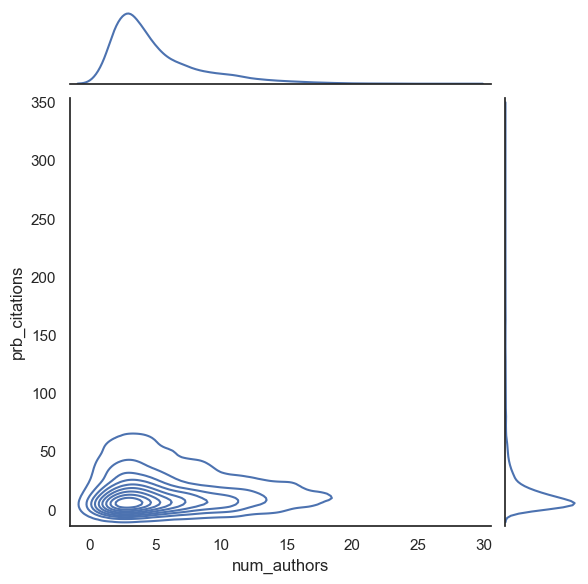

In [96]:
with sns.axes_style('white'):
    sns.jointplot(data=distdata,x='num_authors',y='prb_citations', kind='kde')

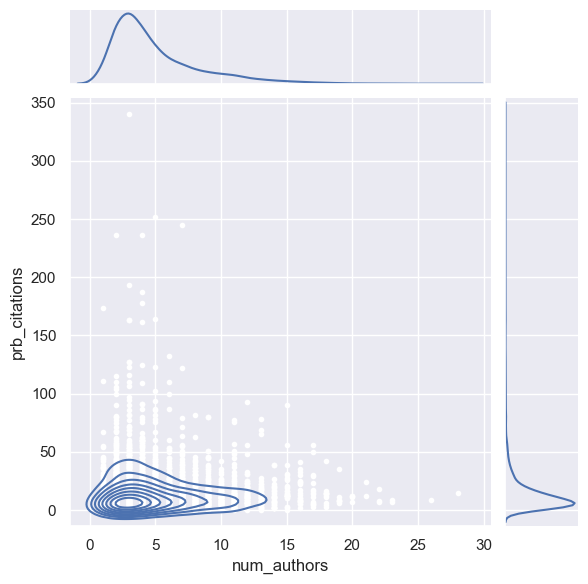

In [97]:
g = sns.jointplot(data=distdata,x='num_authors',y='prb_citations', kind='kde')
g.plot_joint(plt.scatter, c='w', marker='.')
g.ax_joint.collections[0].set_alpha(0)